In [10]:
!apt-get install verilator
!pip3 install fxpmath

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libsystemc libsystemc-dev
Suggested packages:
  gtkwave
The following NEW packages will be installed:
  libsystemc libsystemc-dev verilator
0 upgraded, 3 newly installed, 0 to remove and 23 not upgraded.
Need to get 5,212 kB of archives.
After this operation, 24.7 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 libsystemc amd64 2.3.3-4build1 [449 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 libsystemc-dev amd64 2.3.3-4build1 [238 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 verilator amd64 4.028-1 [4,525 kB]
Fetched 5,212 kB in 0s (10.9 MB/s)
Selecting previously unselected package libsystemc:amd64.
(Reading database ... 128288 files and directories currently installed.)
Preparing to unpack .../libsystemc_2.3.3-4build1_amd64.deb ...
Unpacking libs

In [11]:
!rm -rf soc_image_preprocessing
!git clone https://github.com/DianaNatali/soc_image_preprocessing.git
!rm -rf hardware
!mv soc_image_preprocessing/hardware .
!rm -rf soc_image_preprocessing

Cloning into 'soc_image_preprocessing'...
remote: Enumerating objects: 171, done.
remote: Counting objects: 100% (171/171), done.
remote: Compressing objects: 100% (127/127), done.
remote: Total 171 (delta 57), reused 150 (delta 36), pack-reused 0
Receiving objects: 100% (171/171), 1.05 MiB | 8.98 MiB/s, done.
Resolving deltas: 100% (57/57), done.


In [12]:
#@title Install dependencies {display-mode: "form"}
#@markdown - Click the ▷ button to setup the digital design environment based on [conda-eda](https://github.com/hdl/conda-eda).

openlane_version = 'latest' #@param {type:"string"}
open_pdks_version = 'latest' #@param {type:"string"}

if openlane_version == 'latest':
  openlane_version = ''
if open_pdks_version == 'latest':
  open_pdks_version = ''



import os
import pathlib

!curl -Ls https://micro.mamba.pm/api/micromamba/linux-64/latest | tar -xj bin/micromamba
conda_prefix_path = pathlib.Path('conda-env')
CONDA_PREFIX = str(conda_prefix_path.resolve())
!bin/micromamba create --yes --prefix $CONDA_PREFIX
!echo 'python ==3.7*' >> {CONDA_PREFIX}/conda-meta/pinned
!CI=0 bin/micromamba install --yes --prefix $CONDA_PREFIX \
                     --channel litex-hub \
                     --channel main \
                     openlane={openlane_version} \
                     open_pdks.sky130a={open_pdks_version} 
!python -m pip install gdstk gdstk
PATH = os.environ['PATH']
%env CONDA_PREFIX={CONDA_PREFIX}
%env PATH={CONDA_PREFIX}/bin:{PATH}


                                           __
          __  ______ ___  ____ _____ ___  / /_  ____ _
         / / / / __ `__ \/ __ `/ __ `__ \/ __ \/ __ `/
        / /_/ / / / / / / /_/ / / / / / / /_/ / /_/ /
       / .___/_/ /_/ /_/\__,_/_/ /_/ /_/_.___/\__,_/
      /_/

Empty environment created at prefix: /content/conda-env

                                           __
          __  ______ ___  ____ _____ ___  / /_  ____ _
         / / / / __ `__ \/ __ `/ __ `__ \/ __ \/ __ `/
        / /_/ / / / / / / /_/ / / / / / / /_/ / /_/ /
       / .___/_/ /_/ /_/\__,_/_/ /_/ /_/_.___/\__,_/
      /_/


Pinned packages:
  - python 3.7*


Transaction

  Prefix: /content/conda-env

  Updating specs:

   - openlane=*
   - open_pdks.sky130a=*


  Package                              Version  Build                 Channel                  Size
─────────────────────────────────────────────────────────────────────────────────────────────────────
  Install:
────────────────────────────────────────

In [13]:
%%writefile config.json
{
    "DESIGN_NAME": "sobel_core",
    "VERILOG_FILES": "dir::hardware/sobel/*.v",
    "CLOCK_PERIOD": 20,
    "CLOCK_NET": "i_clk",
    "CLOCK_PORT": "i_clk",

    "FP_SIZING": "absolute",
    "DIE_AREA": "0 0 300 200"
}

Overwriting config.json


In [ ]:
%env PDK=sky130A
!flow.tcl -design .

env: PDK=sky130A
OpenLane 2023.03.01_0_ge10820ec-conda
All rights reserved. (c) 2020-2022 Efabless Corporation and contributors.
Available under the Apache License, version 2.0. See the LICENSE file for more details.

[INFO]: Using configuration in 'config.json'...
[INFO]: PDK Root: /content/conda-env/share/pdk
[INFO]: Process Design Kit: sky130A
[INFO]: Standard Cell Library: sky130_fd_sc_hd
[INFO]: Optimization Standard Cell Library: sky130_fd_sc_hd
[INFO]: Run Directory: /content/runs/RUN_2023.04.03_03.11.09
[INFO]: Preparing LEF files for the nom corner...
[INFO]: Preparing LEF files for the min corner...
[INFO]: Preparing LEF files for the max corner...
[STEP 1]
[INFO]: Running Synthesis (log: runs/RUN_2023.04.03_03.11.09/logs/synthesis/1-synthesis.log)...
[STEP 2]
[INFO]: Running Single-Corner Static Timing Analysis (log: runs/RUN_2023.04.03_03.11.09/logs/synthesis/2-sta.log)...
[STEP 3]
[INFO]: Running Initial Floorplanning (log: runs/RUN_2023.04.03_03.11.09/logs/floorplan/3-ini

In [4]:
!ls

sample_data


In [ ]:
import pathlib
import gdstk

gdss = sorted(pathlib.Path('runs').glob('*/results/final/gds/*.gds'))
library = gdstk.read_gds(gdss[-1])
top_cells = library.top_level()
top_cells[0].write_svg('sobel.svg')

In [ ]:
!pip install svgutils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached svgutils-0.3.4-py3-none-any.whl (10 kB)
  Using cached lxml-4.9.2-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (6.6 MB)


In [ ]:
from IPython.display import SVG,display

display(SVG(filename='sobel.svg'))

In [ ]:
import pandas as pd
import pathlib

pd.options.display.max_rows = None
final_summary_reports = sorted(pathlib.Path('runs').glob('*/reports/metrics.csv'))
df = pd.read_csv(final_summary_reports[-1])
df.transpose()

,0
design,/content
design_name,sobel_control
config,RUN_2023.03.21_22.35.04
flow_status,flow completed
total_runtime,0h7m19s0ms
routed_runtime,0h5m54s0ms
(Cell/mm^2)/Core_Util,70833.333333
DIEAREA_mm^2,0.06
CellPer_mm^2,35416.666667
OpenDP_Util,43.61


In [ ]:
#@title Simulation of Sobel Hardware Implementation 

!apt-get install iverilog
import cv2
from matplotlib import pyplot as plt
import numpy as np

Reading package lists... Done
Building dependency tree       
Reading state information... Done
iverilog is already the newest version (10.3-1build1).
0 upgraded, 0 newly installed, 0 to remove and 23 not upgraded.


In [ ]:
img_original = cv2.imread('hardware/sobel/test_bench/monarch_320x240.jpg') 
gray_opencv = cv2.cvtColor(img_original, cv2.COLOR_BGR2GRAY) 

px_array = []
k = 0
for i in range(0,320): 
    for j in range(0,240):
        px_array.append(gray_opencv[j][i])
        k=k+1

with open('hardware/sobel/test_bench/monarch_320x240.txt', 'w') as f:
    for pixel in px_array:
        f.write(f"{pixel}\n")

In [ ]:
!iverilog -o  sobel_control_TB hardware/sobel/test_bench/sobel_control_TB.v 

In [ ]:
!vvp sobel_control_TB

VCD info: dumpfile sobel_control.vcd opened for output.


In [ ]:
with open('hardware/sobel/test_bench/output_image_sobel.txt', 'r') as f:
    out_hw_txt = f.read().splitlines() 

arr_out_hw = np.array(out_hw_txt)
arr_out_hw_317x240 = np.reshape(arr_out_hw, (320, 240))

arr_out_hw_317x240_int = np.zeros(shape=(240, 315))
for i in range(0,315):
    for x in range(0,240):
        arr_out_hw_317x240_int[x][i] = int(arr_out_hw_317x240[i][x], 16)

cv2.imwrite('hardware/sobel/test_bench/sobel_verilog.jpg', arr_out_hw_317x240_int)
img_sobel_hw = cv2.imread('hardware/sobel/test_bench/sobel_verilog.jpg', 0)

In [ ]:
sobelx = cv2.Sobel(gray_opencv,cv2.CV_64F,1,0,ksize=3)      
sobely = cv2.Sobel(gray_opencv,cv2.CV_64F,0,1,ksize=3)    
abs_grad_x = cv2.convertScaleAbs(sobelx)            
abs_grad_y = cv2.convertScaleAbs(sobely)

weight = 0.5
grad = cv2.addWeighted(abs_grad_x, weight, abs_grad_y, weight, 0)

grad1 = np.zeros(shape=(240, 315))
for i in range(0,240):
    for x in range(0,315):
        if(grad[i][x] < 150):
            grad1[i][x] = 0
        else:
            grad1[i][x] = 255
cv2.imwrite('sobel_openCV.jpg', grad1)

img_sobel_sw = cv2.imread('sobel_openCV.jpg', 0)

(Text(0.5, 1.0, 'Verilog'), ([], []), ([], []))

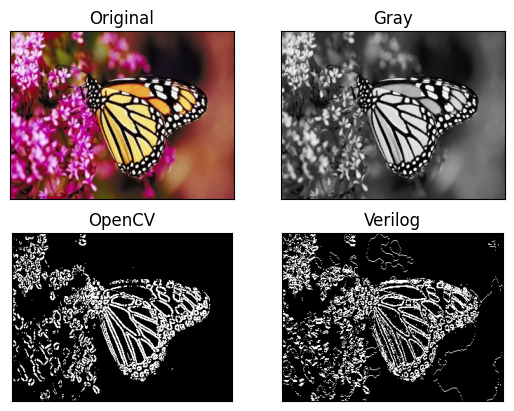

In [ ]:
plt.subplot(2,2,1),plt.imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(gray_opencv, cmap = 'gray')
plt.title('Gray'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(img_sobel_sw,cmap = 'gray')
plt.title('OpenCV'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(img_sobel_hw,cmap = 'gray')
plt.title('Verilog'), plt.xticks([]), plt.yticks([])

In [ ]:
diff = cv2.absdiff(img_sobel_sw, img_sobel_hw)
cv2.imwrite("abs_diff.jpg", diff)

x3 = cv2.imread('abs_diff.jpg',0)
diff_1 = cv2.countNonZero(x3)

similarity = 1 - (diff_1 / (315 * 240))

print('% of simularity: {0:.0f}%'.format(similarity*100))

% of simularity: 58%
